In [1]:
## 2026.02.11 using FineST env
## 2026.02.12 vilization cell type of each ROI
## 2026.03.04 woody_pro:: upload the HE-StarDist embedding and predict the cell type of NCRT_tumor1  
## 2026.03.06 woody_pro:: clearn code 
## 2026.03.13 update cell type level1: nanually make codex_meta_celltype_level1.csv 
## 2026.03.16 use valis to make registration [dont try]
## 2026.03.18 delete two subtypes, adjust scale factor by batch
## 2026.03.19 Train and using NCRT_train.ipynb
## 2026.03.23 Adjust file name and path, then adjust model to use level1 and level2, make model_train_validate.ipynb
## 2026.04.04 woody_pro: SeededNTM; make processing for x, add cv in training for tumor1
## 2026.04.06 Adjust loss function

In [19]:
import os
# Before other imports: PyTorch/torch.distributed may use /tmp; set NCRT_TMPDIR if quota is tight.
_nrtc_tmp = os.environ.get("NCRT_TMPDIR", os.path.join(os.path.expanduser("~"), "ssd2", "tmp"))
try:
    os.makedirs(_nrtc_tmp, exist_ok=True)
    os.environ["TMPDIR"] = _nrtc_tmp
    os.environ["TEMP"] = _nrtc_tmp
    os.environ["TMP"] = _nrtc_tmp
    import tempfile as _tf_nb
    _tf_nb.tempdir = _nrtc_tmp
except OSError:
    pass

import sys
import importlib
import pandas as pd
from pathlib import Path

## Add the code directory to Python path
path = '/home/lingyu/ssd2/Python/'
code_dir = f'{path}Hist2Pheno/code/Hist2Pheno_pkg/'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

## Import (or reload) base module
# Do NOT `import model` — that binds the name ``model`` to the *module* and will shadow
# your trained ``torch.nn.Module`` after ``globals().update(LP)`` when this cell is re-run.
import base
import plot
import model as model_pkg
## Impost：Force reload base.py
importlib.reload(base)
importlib.reload(plot)
importlib.reload(model_pkg)

## Re-import the function (otherwise, still be old_version).
from base import (
    get_celltype_coords,
    divide_into_rois_by_parent,
    get_pixel_size,
    visualize_roi_cells,
    visualize_all_rois_with_he,
    visualize_all_rois,
    extract_and_save_celltype_by_tumorid,
    transformation_matrix_properties,
    invert_transformation_matrix,
    align_pcf_to_he_coordinates,
    add_pixel_coords,
    verify_transformation_alignment,
    merge_coordinates,
    analyze_and_filter_classes_by_gap,
    ImprovedMLPClassifier,
    load_embeddings,
    match_embeddings,
    prepare_matched_embeddings,
    evaluate,
    create_dataloaders,
    train_model,
    CellTypeDataset,
    evaluate_and_plot_on_all_data,
    align_matrix,
    match_StarCoords2ROI,
    match_celltype2stardist,
    merge_celltype_level12,
    make_PCF2HE_alignment,
    load_cell_pixcoords,load_hist_embeddings,
    match_hist2cell_matrix,
    make_PCF2HE2StarDist_alignment,
    save_hce_validation_metrics,
    split_train_test,
    prepare_data_leave_one_group_out,
    spatial_tile_groups_for_logo,
    loader_train_test,
    first_pth_tensor
    
)

from plot import (
    plot_celltype_distribution,
    visualize_all_celltype_distributions,
    plot_celltype_distribution,
    plot_celltype_spatial_distribution,
    plot_PCF_HE_counts,
    plot_WSI_counts,
    plot_cell_area_histogram,
    plot_confusion_matrix,
    plot_level1_spatial_distribution,
    plot_per_class_f1,
    plot_per_class_accuracy,
    plot_level1_accuracy_from_level2_predictions
)

from model import (
    build_mlp_classifier,
    get_best_checkpoint_path,
    train_and_save_model,
    infer_input_dim_and_num_classes,
    mode_validation,
    load_model_for_predict,
    train_and_save_model_from_split,
    mode_validation_from_split,
    train_hce_leave_one_group_out_cv,
    run_logo_cv_and_load_best_model,
    report_logo_cv_means_and_insample_eval,
    run_logo_cv_with_insample_report,
)

## Import HAS_OPENSLIDE and HAS_TIFFFILE from base module for use in notebook
HAS_OPENSLIDE = base.HAS_OPENSLIDE
HAS_TIFFFILE = base.HAS_TIFFFILE

## Also import openslide module if available (needed for direct use in some cells)
if HAS_OPENSLIDE:
    import openslide
else:
    openslide = None

try:
    import tifffile
except ImportError:
    tifffile = None

print("Successfully reloaded functions from base.py")
print(f"openslide: {HAS_OPENSLIDE}, tifffile: {HAS_TIFFFILE}")


## reset pathway
os.chdir(f'{path}Hist2Pheno/data/CODEX/ESCC')
therapy_data = 'NCRT'
image_feature = f'sc_{therapy_data}'
therapy_model = f'{therapy_data}_project_tumor1'
segment_data1 = f'{therapy_data}_project - seg 1-14'
segment_data2 = f'{therapy_data}_project - seg 15-28'
export_data = 'export'
save_result = 'result'

stardist_data = 'StarDist_Segment'
transfer_data = 'he_cell_coords'
qupath_corner = 'QupathCorners'

Successfully reloaded functions from base.py
openslide: False, tifffile: True


In [2]:
## CUDA/CPU sanity check for training setup
import os
import sys
import torch

# Default physical GPU index 2 (torch device string cuda:2). Override without editing:
#   export NCRT_CUDA_DEVICE=0
CUDA_DEVICE_INDEX = int(os.environ.get("NCRT_CUDA_DEVICE", "1"))

print(sys.executable)
print(
    f"torch {torch.__version__} | built with CUDA: {torch.version.cuda} | "
    f"cuda.is_available: {torch.cuda.is_available()}"
)

if torch.cuda.is_available():
    n_gpu = torch.cuda.device_count()
    if CUDA_DEVICE_INDEX < 0 or CUDA_DEVICE_INDEX >= n_gpu:
        raise RuntimeError(
            f"CUDA_DEVICE_INDEX={CUDA_DEVICE_INDEX} out of range; only {n_gpu} GPU(s) visible."
        )
    torch.cuda.set_device(CUDA_DEVICE_INDEX)
    device = torch.device(f"cuda:{CUDA_DEVICE_INDEX}")
    # Reproducibility-first: use deterministic cuDNN settings.
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    amp_scaler = torch.amp.GradScaler("cuda")  # AMP only on CUDA
    print(
        f"Using device cuda:{CUDA_DEVICE_INDEX} | "
        f"{torch.cuda.get_device_name(CUDA_DEVICE_INDEX)}"
    )
else:
    allow_cpu = os.environ.get("NCRT_ALLOW_CPU_TRAIN", "").strip().lower() in ("1", "true", "yes")
    if allow_cpu:
        device, amp_scaler = torch.device("cpu"), None
        print("WARNING: CUDA unavailable, training on CPU (set NCRT_ALLOW_CPU_TRAIN=1).")
    else:
        raise RuntimeError(
            "CUDA unavailable. Please use a CUDA-enabled PyTorch build, "
            "or set NCRT_ALLOW_CPU_TRAIN=1 to run on CPU."
        )

if device.type == "cuda":
    print(f"device: {device} | {torch.cuda.get_device_name(CUDA_DEVICE_INDEX)}")
else:
    print(f"device: {device}")



## Reproducibility setup (run this first after kernel restart)
import os
import random
import numpy as np
import torch

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
# Needed by CUDA for deterministic GEMM on some ops.
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# Enforce deterministic behavior (may reduce speed).
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.use_deterministic_algorithms(True)

print(f"Reproducibility configured with SEED={SEED}")

/ssd2/users/lingyu/conda_envs/SeededNTM/bin/python
torch 2.9.1+cu130 | built with CUDA: 13.0 | cuda.is_available: True
Using device cuda:1 | NVIDIA RTX PRO 6000 Blackwell Server Edition
device: cuda:1 | NVIDIA RTX PRO 6000 Blackwell Server Edition
Reproducibility configured with SEED=42


In [20]:
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')
tensor = first_pth_tensor(hist_embedding_dir)

Found file: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1/sc_pth_16_16/sc_NCRT_8581.601852334961_4044.732986963536.pth
Loaded type: <class 'tuple'>
tensor.shape of the first .pth file: torch.Size([1, 1, 384])


/home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/ESCC/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1/sc_pth_16_16/sc_NCRT_8581.601852334961_4044.732986963536.pth

<class 'tuple'>

torch.Size([1, 1, 384])

## Cell Type Classification Model

Leave-one-group-out (LOGO) CV (sklearn `LeaveOneGroupOut` idea).  
Uses npz `matched_features_tumor1_logo.npz` with a `TumorID` column when available. If that column is constant for all rows (typical for tumor1-only CSV), the notebook **falls back to spatial tiles** on `X_pix_HE`×`Y_pix_HE` (`spatial_tile_groups_for_logo`).

In [ ]:
from pathlib import Path
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')

## 取第一个 .pth 文件
pth_files = list(hist_embedding_dir.glob("*.pth"))
pth_file = pth_files[0]
print(pth_file)

## Load .pth file
image_tensor = torch.load(pth_file)
print(type(image_tensor))
# print(image_tensor)

## if class 'tuple'，extract it tensor: 
tensor = image_tensor[0]  
print(tensor.shape)    ## torch.Size([1, 1, 384])

/home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1/sc_pth_16_16/sc_NCRT_8581.601852334961_4044.732986963536.pth
<class 'tuple'>
torch.Size([1, 1, 384])


In [4]:
## Match embeddings with celltype data by coordinates
cell_coords_path = f'{path}Hist2Pheno/data/CODEX/ESCC/he_cell_coords/{therapy_data}_CellPixCoords_tumor1.csv'
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')
# LOGO needs per-cell groups in the npz; use a dedicated cache file (first run builds it).
matched_features_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1_logo.npz'
LOGO_GROUP_COL = "TumorID"

# Coordinate matching tolerance in pixels (float supported).
# base.py now handles optional `celltype_level1` automatically.
match_tolerance = 1.0
X, y, y_level1, X_coords_matched, groups = match_hist2cell_matrix(
    cell_coords_path,
    hist_embedding_dir,
    matched_features_path,
    coord_cols=('X_pix_HE', 'Y_pix_HE'),
    tolerance=match_tolerance,
    pth_prefix=image_feature,
    group_col=LOGO_GROUP_COL,
    return_groups=True,
)
if groups is None:
    raise ValueError(
        f"No 'groups' in {matched_features_path}. Remove that npz and re-run once so "
        f"{LOGO_GROUP_COL!r} is written, or check the CSV column name."
    )

# Within tumor1 CSV, TumorID is often a single constant (e.g. "NCRT_tumor1") — LOGO needs ≥2 groups.
import numpy as np

LOGO_SPATIAL_NX, LOGO_SPATIAL_NY = 2, 2
_n_grp = int(np.unique(groups).size)
if _n_grp < 2:
    groups = spatial_tile_groups_for_logo(
        X_coords_matched[:, 0],
        X_coords_matched[:, 1],
        nx=LOGO_SPATIAL_NX,
        ny=LOGO_SPATIAL_NY,
    )
    print(
        f"LOGO_GROUP_COL={LOGO_GROUP_COL!r} has only {_n_grp} unique value(s); "
        f"using spatial_tile_groups_for_logo(nx={LOGO_SPATIAL_NX}, ny={LOGO_SPATIAL_NY}) on X_pix_HE/Y_pix_HE."
    )
_n_final = int(np.unique(groups).size)
print(f"LOGO: {_n_final} unique groups, {len(groups)} cells")
if _n_final < 2:
    raise ValueError(
        "Still fewer than 2 LOGO groups after spatial tiling; check coordinates or use another group_col."
    )

Loading celltype Ground Truth ...
  Loaded 80303 cells
  Cell types: 40 unique types

  ✓ matched_features cache found; skipping .pth directory load.
Loading pre-saved matched data...
  ✓ Loaded from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_logo.npz
  X shape: (80303, 384)
  y shape: (80303,)
  Number of classes: 40
  ✓ Coordinates found in saved data
  ✓ Coordinates loaded: (80303, 2)
LOGO_GROUP_COL='TumorID' has only 1 unique value(s); using spatial_tile_groups_for_logo(nx=2, ny=2) on X_pix_HE/Y_pix_HE.
LOGO: 4 unique groups, 80303 cells


In [5]:
# Same L2 rare-class filtering as split_train_test, but keep all rows for LOGO (no 70/30 split).
cv_data = prepare_data_leave_one_group_out(X, y, y_level1, groups)

class_names = cv_data["class_names"]
class_names_level1 = cv_data["class_names_level1"]
le_level2 = cv_data["le_level2"]
le_level1 = cv_data["le_level1"]

# Scaler fit on all filtered cells (for spatial plots / full-data eval with one checkpoint).
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(cv_data["X_f"])

# Coordinates aligned with cv_data rows (same mask as rare-L2 filtering)
X_coords_plot = (
    X_coords_matched[cv_data["mask"]] if X_coords_matched is not None else None
)

# Optional: single random 70/30 split for comparison with LOGO
RUN_RANDOM_TRAIN_TEST_SPLIT = False
if RUN_RANDOM_TRAIN_TEST_SPLIT:
    result = split_train_test(X, y, y_level1)
else:
    result = None


Leave-one-group-out prep (filtered data):
  Samples: 80302, features: 384
  Level2 classes: 39, Level1 classes: 7
  Groups (for LOGO): 4 unique


In [6]:
# LOGO：训练与评估由 ``run_logo_cv_with_insample_report`` / ``train_hce_leave_one_group_out_cv`` 内部构建 DataLoader。
# If you set RUN_RANDOM_TRAIN_TEST_SPLIT=True above, uncomment:
# loaders = loader_train_test(result, seed=SEED, train_balance_sampler=False)

loaders = None
train_loader = val_loader = val_loader_eval = None
train_dataset = val_dataset = None
X_train_scaled = y_train_encoded = y_test_encoded = None
y_train_level1_encoded = y_test_level1_encoded = None
y_encoded_f = cv_data["y_encoded_f"]
y_level1_encoded_f = cv_data["y_level1_encoded_f"]

## MLP classifier

In [7]:
# Ablation: unified HCE weights (w1=CE(L1 head), w2=CE(L2_head), w12=NLL(L1_agg from L2 softmax))
import os
import pandas as pd

LOGO_RESUME_FROM_CHECKPOINTS = False  # False=每个配置都重新训练；True/None=按已有 fold checkpoint 复用
AB_PATIENCE = 10
AB_MAX_EPOCHS = 50
AB_HIDDEN_DIMS = (768, 384, 192)

# Approx. old "HCE-only" (no L1 head): w1=0, w2=0.5, w12=0.5  == 0.5*CE(L2_head)+0.5*NLL(L1_agg)
# Then sweep emphasis on L1 head vs hierarchical term.
ABLATION_CONFIGS = [
    {"tag": "A_w2_w12_only", "hce_w1": 0.0, "hce_w2": 0.5, "hce_w12": 0.5},
    {"tag": "B_equal", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 1.0},
    {"tag": "C_emph_L1head", "hce_w1": 2.0, "hce_w2": 1.0, "hce_w12": 1.0},
    {"tag": "D_emph_L2", "hce_w1": 1.0, "hce_w2": 2.0, "hce_w12": 1.0},
    {"tag": "E_emph_agg", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 2.0},
]

ablation_runs = {}
rows = []

for cfg in ABLATION_CONFIGS:
    tag = cfg["tag"]
    ckpt_dir = os.path.join(
        path,
        "Hist2Pheno/data/CODEX/ESCC",
        therapy_data,
        therapy_model,
        "ablation_ckpts",
        tag,
    )
    print("\n" + "=" * 80)
    print(f"[Ablation] Running: {tag}")
    print("=" * 80)

    LP_i = run_logo_cv_with_insample_report(
        device=device,
        cv_data=cv_data,
        scaler=scaler,
        class_names=class_names,
        evaluate=evaluate,
        path=path,
        therapy_data=therapy_data,
        therapy_model=therapy_model,
        hce_w1=cfg["hce_w1"],
        hce_w2=cfg["hce_w2"],
        hce_w12=cfg["hce_w12"],
        patience=AB_PATIENCE,
        max_epochs=AB_MAX_EPOCHS,
        hidden_dims=AB_HIDDEN_DIMS,
        loader_kwargs={"seed": SEED, "train_balance_sampler": False},
        resume_from_checkpoints=LOGO_RESUME_FROM_CHECKPOINTS,
        logo_checkpoint_dir=ckpt_dir,
    )

    ablation_runs[tag] = LP_i
    score_l2 = float(LP_i["val_macro_f1"] + LP_i["val_weighted_f1"])
    rows.append(
        {
            "tag": tag,
            "hce_w1": cfg["hce_w1"],
            "hce_w2": cfg["hce_w2"],
            "hce_w12": cfg["hce_w12"],
            "hidden_dims": str(AB_HIDDEN_DIMS),
            "l2_acc": float(LP_i["val_acc"]),
            "l2_macro_f1": float(LP_i["val_macro_f1"]),
            "l2_weighted_f1": float(LP_i["val_weighted_f1"]),
            "l2_select_score": score_l2,
            "l1_acc": float(LP_i["val_level1_acc"]),
            "l1_macro_f1": float(LP_i["val_level1_macro_f1"]),
            "l1_weighted_f1": float(LP_i["val_level1_weighted_f1"]),
            "best_epoch": int(LP_i["best_epoch"]),
        }
    )

AB_SUMMARY_DF = pd.DataFrame(rows).sort_values("l2_select_score", ascending=False).reset_index(drop=True)
print("\nAblation summary (sorted by l2_select_score):")
display(AB_SUMMARY_DF)

best_tag = AB_SUMMARY_DF.iloc[0]["tag"]
LP = ablation_runs[best_tag]
print(f"\nSelected LP from best config: {best_tag}")

# 供后续单元格使用：logo_summary, model, val_preds, input_dim, …
globals().update(LP)
globals()["AB_SUMMARY_DF"] = AB_SUMMARY_DF


[Ablation] Running: A_w2_w12_only
Train dataset size: 64280
Val dataset size: 16022
Batch size: 1024
Feature dimension: 384

LOGO fold 0: held-out group = 'tile_x0_y0'
  Training: resume_from_checkpoints=False (e.g. CLI --logo_resume false) — full HCE training for this fold.
Model configuration:
  Input dimension: 384
  Number of level2 classes: 39
  Number of level1 classes: 7
Model initialized on cuda:1
Model parameters: 676,462
Unified HCE: total_loss = 0.000*CE(L1_head) + 0.500*CE(L2_head) + 0.500*NLL(L1_from_L2_agg)
Starting training with HCE...


/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.88s, LR: 0.000132)
  Train unified HCE: 3.6730
  CE(L1_head): 6.9473, CE(L2_head): 5.0955, NLL(L1_agg): 2.2506
  Val L2 Accuracy: 0.2274
  Val L2 Macro-F1: 0.0439
  Val L2 Weighted-F1: 0.2207
  Val L1 Accuracy: 0.3863
  Val L1 Macro-F1: 0.2689
  Val L1 Weighted-F1: 0.3809
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.9143
  ✓ Best model saved (4-term score=0.9143; L2 macro_f1=0.0439, L2 weighted_f1=0.2207, L2 Acc=0.2274)

Epoch 2/50 (1.52s, LR: 0.000373)
  Train unified HCE: 2.9137
  CE(L1_head): 6.6725, CE(L2_head): 4.2365, NLL(L1_agg): 1.5909
  Val L2 Accuracy: 0.2754
  Val L2 Macro-F1: 0.0545
  Val L2 Weighted-F1: 0.2671
  Val L1 Accuracy: 0.4533
  Val L1 Macro-F1: 0.3128
  Val L1 Weighted-F1: 0.4409
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0753
  ✓ Best model saved (4-term score=1.0753; L2 macro_f1=0.0545, L2 weighted_f1=0.2671, L2 Acc=0.2754)

Epoch 3/50 (1.48s, LR: 0.000671)
  Train unified HCE: 2.5148
  CE(L1_head

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.72s, LR: 0.000132)
  Train unified HCE: 3.8396
  CE(L1_head): 8.6430, CE(L2_head): 5.4179, NLL(L1_agg): 2.2613
  Val L2 Accuracy: 0.3296
  Val L2 Macro-F1: 0.0337
  Val L2 Weighted-F1: 0.3559
  Val L1 Accuracy: 0.3689
  Val L1 Macro-F1: 0.2429
  Val L1 Weighted-F1: 0.4129
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0453
  ✓ Best model saved (4-term score=1.0453; L2 macro_f1=0.0337, L2 weighted_f1=0.3559, L2 Acc=0.3296)

Epoch 2/50 (1.75s, LR: 0.000374)
  Train unified HCE: 2.9331
  CE(L1_head): 7.2568, CE(L2_head): 4.2510, NLL(L1_agg): 1.6152
  Val L2 Accuracy: 0.4108
  Val L2 Macro-F1: 0.0455
  Val L2 Weighted-F1: 0.4222
  Val L1 Accuracy: 0.4643
  Val L1 Macro-F1: 0.2865
  Val L1 Weighted-F1: 0.4901
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.2442
  ✓ Best model saved (4-term score=1.2442; L2 macro_f1=0.0455, L2 weighted_f1=0.4222, L2 Acc=0.4108)

Epoch 3/50 (1.71s, LR: 0.000672)
  Train unified HCE: 2.5310
  CE(L1_head

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.74s, LR: 0.000132)
  Train unified HCE: 3.8642
  CE(L1_head): 6.9298, CE(L2_head): 5.3729, NLL(L1_agg): 2.3554
  Val L2 Accuracy: 0.0274
  Val L2 Macro-F1: 0.0192
  Val L2 Weighted-F1: 0.0363
  Val L1 Accuracy: 0.1737
  Val L1 Macro-F1: 0.1471
  Val L1 Weighted-F1: 0.1577
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.3603
  ✓ Best model saved (4-term score=0.3603; L2 macro_f1=0.0192, L2 weighted_f1=0.0363, L2 Acc=0.0274)

Epoch 2/50 (1.80s, LR: 0.000374)
  Train unified HCE: 2.9736
  CE(L1_head): 6.0407, CE(L2_head): 4.3709, NLL(L1_agg): 1.5764
  Val L2 Accuracy: 0.0827
  Val L2 Macro-F1: 0.0376
  Val L2 Weighted-F1: 0.0992
  Val L1 Accuracy: 0.2556
  Val L1 Macro-F1: 0.1840
  Val L1 Weighted-F1: 0.2491
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.5699
  ✓ Best model saved (4-term score=0.5699; L2 macro_f1=0.0376, L2 weighted_f1=0.0992, L2 Acc=0.0827)

Epoch 3/50 (1.57s, LR: 0.000671)
  Train unified HCE: 2.5524
  CE(L1_head

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.48s, LR: 0.000132)
  Train unified HCE: 4.1405
  CE(L1_head): 8.5362, CE(L2_head): 5.5424, NLL(L1_agg): 2.7385
  Val L2 Accuracy: 0.0310
  Val L2 Macro-F1: 0.0171
  Val L2 Weighted-F1: 0.0423
  Val L1 Accuracy: 0.2400
  Val L1 Macro-F1: 0.1722
  Val L1 Weighted-F1: 0.2656
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.4971
  ✓ Best model saved (4-term score=0.4971; L2 macro_f1=0.0171, L2 weighted_f1=0.0423, L2 Acc=0.0310)

Epoch 2/50 (1.62s, LR: 0.000374)
  Train unified HCE: 2.9918
  CE(L1_head): 7.6655, CE(L2_head): 4.3677, NLL(L1_agg): 1.6160
  Val L2 Accuracy: 0.0972
  Val L2 Macro-F1: 0.0363
  Val L2 Weighted-F1: 0.1208
  Val L1 Accuracy: 0.3341
  Val L1 Macro-F1: 0.2261
  Val L1 Weighted-F1: 0.3402
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7234
  ✓ Best model saved (4-term score=0.7234; L2 macro_f1=0.0363, L2 weighted_f1=0.1208, L2 Acc=0.0972)

Epoch 3/50 (1.59s, LR: 0.000671)
  Train unified HCE: 2.5626
  CE(L1_head

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.37s, LR: 0.000132)
  Train unified HCE: 13.0834
  CE(L1_head): 5.3600, CE(L2_head): 5.2748, NLL(L1_agg): 2.4486
  Val L2 Accuracy: 0.2349
  Val L2 Macro-F1: 0.0355
  Val L2 Weighted-F1: 0.2063
  Val L1 Accuracy: 0.4014
  Val L1 Macro-F1: 0.2600
  Val L1 Weighted-F1: 0.3702
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.8720
  ✓ Best model saved (4-term score=0.8720; L2 macro_f1=0.0355, L2 weighted_f1=0.2063, L2 Acc=0.2349)

Epoch 2/50 (1.52s, LR: 0.000373)
  Train unified HCE: 8.9241
  CE(L1_head): 3.0426, CE(L2_head): 4.2747, NLL(L1_agg): 1.6068
  Val L2 Accuracy: 0.2824
  Val L2 Macro-F1: 0.0537
  Val L2 Weighted-F1: 0.2663
  Val L1 Accuracy: 0.4458
  Val L1 Macro-F1: 0.3081
  Val L1 Weighted-F1: 0.4317
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0597
  ✓ Best model saved (4-term score=1.0597; L2 macro_f1=0.0537, L2 weighted_f1=0.2663, L2 Acc=0.2824)

Epoch 3/50 (1.47s, LR: 0.000671)
  Train unified HCE: 7.0051
  CE(L1_hea

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.69s, LR: 0.000132)
  Train unified HCE: 14.3364
  CE(L1_head): 6.2400, CE(L2_head): 5.5977, NLL(L1_agg): 2.4987
  Val L2 Accuracy: 0.1652
  Val L2 Macro-F1: 0.0221
  Val L2 Weighted-F1: 0.2292
  Val L1 Accuracy: 0.2134
  Val L1 Macro-F1: 0.1935
  Val L1 Weighted-F1: 0.2674
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7121
  ✓ Best model saved (4-term score=0.7121; L2 macro_f1=0.0221, L2 weighted_f1=0.2292, L2 Acc=0.1652)

Epoch 2/50 (1.68s, LR: 0.000374)
  Train unified HCE: 9.3697
  CE(L1_head): 3.3241, CE(L2_head): 4.3570, NLL(L1_agg): 1.6885
  Val L2 Accuracy: 0.3705
  Val L2 Macro-F1: 0.0514
  Val L2 Weighted-F1: 0.4070
  Val L1 Accuracy: 0.4038
  Val L1 Macro-F1: 0.2784
  Val L1 Weighted-F1: 0.4504
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.1872
  ✓ Best model saved (4-term score=1.1872; L2 macro_f1=0.0514, L2 weighted_f1=0.4070, L2 Acc=0.3705)

Epoch 3/50 (1.70s, LR: 0.000672)
  Train unified HCE: 7.1904
  CE(L1_hea

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.71s, LR: 0.000132)
  Train unified HCE: 12.8849
  CE(L1_head): 5.0358, CE(L2_head): 5.6820, NLL(L1_agg): 2.1671
  Val L2 Accuracy: 0.0212
  Val L2 Macro-F1: 0.0138
  Val L2 Weighted-F1: 0.0222
  Val L1 Accuracy: 0.1717
  Val L1 Macro-F1: 0.1406
  Val L1 Weighted-F1: 0.1537
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.3303
  ✓ Best model saved (4-term score=0.3303; L2 macro_f1=0.0138, L2 weighted_f1=0.0222, L2 Acc=0.0212)

Epoch 2/50 (1.64s, LR: 0.000374)
  Train unified HCE: 9.3339
  CE(L1_head): 3.1875, CE(L2_head): 4.5214, NLL(L1_agg): 1.6250
  Val L2 Accuracy: 0.0581
  Val L2 Macro-F1: 0.0314
  Val L2 Weighted-F1: 0.0803
  Val L1 Accuracy: 0.2538
  Val L1 Macro-F1: 0.1710
  Val L1 Weighted-F1: 0.2318
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.5145
  ✓ Best model saved (4-term score=0.5145; L2 macro_f1=0.0314, L2 weighted_f1=0.0803, L2 Acc=0.0581)

Epoch 3/50 (1.57s, LR: 0.000671)
  Train unified HCE: 7.3921
  CE(L1_hea

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.59s, LR: 0.000132)
  Train unified HCE: 13.4633
  CE(L1_head): 5.2389, CE(L2_head): 5.4349, NLL(L1_agg): 2.7895
  Val L2 Accuracy: 0.0264
  Val L2 Macro-F1: 0.0160
  Val L2 Weighted-F1: 0.0271
  Val L1 Accuracy: 0.2239
  Val L1 Macro-F1: 0.1631
  Val L1 Weighted-F1: 0.2534
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.4596
  ✓ Best model saved (4-term score=0.4596; L2 macro_f1=0.0160, L2 weighted_f1=0.0271, L2 Acc=0.0264)

Epoch 2/50 (1.58s, LR: 0.000374)
  Train unified HCE: 9.1200
  CE(L1_head): 3.1588, CE(L2_head): 4.3355, NLL(L1_agg): 1.6257
  Val L2 Accuracy: 0.1058
  Val L2 Macro-F1: 0.0383
  Val L2 Weighted-F1: 0.1232
  Val L1 Accuracy: 0.3567
  Val L1 Macro-F1: 0.2283
  Val L1 Weighted-F1: 0.3513
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7411
  ✓ Best model saved (4-term score=0.7411; L2 macro_f1=0.0383, L2 weighted_f1=0.1232, L2 Acc=0.1058)

Epoch 3/50 (1.58s, LR: 0.000671)
  Train unified HCE: 7.1542
  CE(L1_hea

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.46s, LR: 0.000132)
  Train unified HCE: 18.3504
  CE(L1_head): 5.0277, CE(L2_head): 5.6413, NLL(L1_agg): 2.6538
  Val L2 Accuracy: 0.1997
  Val L2 Macro-F1: 0.0301
  Val L2 Weighted-F1: 0.1713
  Val L1 Accuracy: 0.3411
  Val L1 Macro-F1: 0.2334
  Val L1 Weighted-F1: 0.3245
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7593
  ✓ Best model saved (4-term score=0.7593; L2 macro_f1=0.0301, L2 weighted_f1=0.1713, L2 Acc=0.1997)

Epoch 2/50 (1.53s, LR: 0.000373)
  Train unified HCE: 11.8923
  CE(L1_head): 2.8814, CE(L2_head): 4.4432, NLL(L1_agg): 1.6862
  Val L2 Accuracy: 0.2578
  Val L2 Macro-F1: 0.0498
  Val L2 Weighted-F1: 0.2455
  Val L1 Accuracy: 0.4332
  Val L1 Macro-F1: 0.2933
  Val L1 Weighted-F1: 0.4177
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0063
  ✓ Best model saved (4-term score=1.0063; L2 macro_f1=0.0498, L2 weighted_f1=0.2455, L2 Acc=0.2578)

Epoch 3/50 (1.56s, LR: 0.000671)
  Train unified HCE: 8.8856
  CE(L1_he

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.52s, LR: 0.000132)
  Train unified HCE: 18.4452
  CE(L1_head): 5.0865, CE(L2_head): 5.8377, NLL(L1_agg): 2.4345
  Val L2 Accuracy: 0.1791
  Val L2 Macro-F1: 0.0228
  Val L2 Weighted-F1: 0.2383
  Val L1 Accuracy: 0.2134
  Val L1 Macro-F1: 0.1701
  Val L1 Weighted-F1: 0.2609
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.6920
  ✓ Best model saved (4-term score=0.6920; L2 macro_f1=0.0228, L2 weighted_f1=0.2383, L2 Acc=0.1791)

Epoch 2/50 (1.53s, LR: 0.000374)
  Train unified HCE: 12.3009
  CE(L1_head): 2.9645, CE(L2_head): 4.6079, NLL(L1_agg): 1.7640
  Val L2 Accuracy: 0.3464
  Val L2 Macro-F1: 0.0403
  Val L2 Weighted-F1: 0.3752
  Val L1 Accuracy: 0.3550
  Val L1 Macro-F1: 0.2403
  Val L1 Weighted-F1: 0.4000
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0559
  ✓ Best model saved (4-term score=1.0559; L2 macro_f1=0.0403, L2 weighted_f1=0.3752, L2 Acc=0.3464)

Epoch 3/50 (1.50s, LR: 0.000672)
  Train unified HCE: 9.0039
  CE(L1_he

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.55s, LR: 0.000132)
  Train unified HCE: 19.1636
  CE(L1_head): 5.3839, CE(L2_head): 5.7036, NLL(L1_agg): 2.6922
  Val L2 Accuracy: 0.0149
  Val L2 Macro-F1: 0.0124
  Val L2 Weighted-F1: 0.0196
  Val L1 Accuracy: 0.1210
  Val L1 Macro-F1: 0.1224
  Val L1 Weighted-F1: 0.1349
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.2893
  ✓ Best model saved (4-term score=0.2893; L2 macro_f1=0.0124, L2 weighted_f1=0.0196, L2 Acc=0.0149)

Epoch 2/50 (1.45s, LR: 0.000374)
  Train unified HCE: 12.6554
  CE(L1_head): 3.1568, CE(L2_head): 4.6640, NLL(L1_agg): 1.6777
  Val L2 Accuracy: 0.0674
  Val L2 Macro-F1: 0.0251
  Val L2 Weighted-F1: 0.0525
  Val L1 Accuracy: 0.2022
  Val L1 Macro-F1: 0.1589
  Val L1 Weighted-F1: 0.1728
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.4093
  ✓ Best model saved (4-term score=0.4093; L2 macro_f1=0.0251, L2 weighted_f1=0.0525, L2 Acc=0.0674)

Epoch 3/50 (1.59s, LR: 0.000671)
  Train unified HCE: 9.6725
  CE(L1_he

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.60s, LR: 0.000132)
  Train unified HCE: 19.3069
  CE(L1_head): 5.6080, CE(L2_head): 5.4375, NLL(L1_agg): 2.6535
  Val L2 Accuracy: 0.0238
  Val L2 Macro-F1: 0.0172
  Val L2 Weighted-F1: 0.0278
  Val L1 Accuracy: 0.2040
  Val L1 Macro-F1: 0.1564
  Val L1 Weighted-F1: 0.2219
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.4233
  ✓ Best model saved (4-term score=0.4233; L2 macro_f1=0.0172, L2 weighted_f1=0.0278, L2 Acc=0.0238)

Epoch 2/50 (1.63s, LR: 0.000374)
  Train unified HCE: 12.2107
  CE(L1_head): 3.0483, CE(L2_head): 4.4377, NLL(L1_agg): 1.6763
  Val L2 Accuracy: 0.0498
  Val L2 Macro-F1: 0.0273
  Val L2 Weighted-F1: 0.0690
  Val L1 Accuracy: 0.3585
  Val L1 Macro-F1: 0.2360
  Val L1 Weighted-F1: 0.3526
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.6849
  ✓ Best model saved (4-term score=0.6849; L2 macro_f1=0.0273, L2 weighted_f1=0.0690, L2 Acc=0.0498)

Epoch 3/50 (1.71s, LR: 0.000671)
  Train unified HCE: 9.1067
  CE(L1_he

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.44s, LR: 0.000132)
  Train unified HCE: 18.7876
  CE(L1_head): 5.3309, CE(L2_head): 5.3978, NLL(L1_agg): 2.6610
  Val L2 Accuracy: 0.1651
  Val L2 Macro-F1: 0.0250
  Val L2 Weighted-F1: 0.1418
  Val L1 Accuracy: 0.3322
  Val L1 Macro-F1: 0.2595
  Val L1 Weighted-F1: 0.3470
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7733
  ✓ Best model saved (4-term score=0.7733; L2 macro_f1=0.0250, L2 weighted_f1=0.1418, L2 Acc=0.1651)

Epoch 2/50 (1.56s, LR: 0.000373)
  Train unified HCE: 13.3990
  CE(L1_head): 3.1130, CE(L2_head): 4.2754, NLL(L1_agg): 1.7352
  Val L2 Accuracy: 0.2641
  Val L2 Macro-F1: 0.0524
  Val L2 Weighted-F1: 0.2612
  Val L1 Accuracy: 0.4463
  Val L1 Macro-F1: 0.3297
  Val L1 Weighted-F1: 0.4483
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0916
  ✓ Best model saved (4-term score=1.0916; L2 macro_f1=0.0524, L2 weighted_f1=0.2612, L2 Acc=0.2641)

Epoch 3/50 (1.53s, LR: 0.000671)
  Train unified HCE: 10.7411
  CE(L1_h

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.60s, LR: 0.000132)
  Train unified HCE: 19.9061
  CE(L1_head): 5.9226, CE(L2_head): 5.6757, NLL(L1_agg): 2.6320
  Val L2 Accuracy: 0.3159
  Val L2 Macro-F1: 0.0309
  Val L2 Weighted-F1: 0.3418
  Val L1 Accuracy: 0.3176
  Val L1 Macro-F1: 0.2084
  Val L1 Weighted-F1: 0.3616
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.9426
  ✓ Best model saved (4-term score=0.9426; L2 macro_f1=0.0309, L2 weighted_f1=0.3418, L2 Acc=0.3159)

Epoch 2/50 (1.64s, LR: 0.000374)
  Train unified HCE: 13.9185
  CE(L1_head): 3.4354, CE(L2_head): 4.3623, NLL(L1_agg): 1.7585
  Val L2 Accuracy: 0.3913
  Val L2 Macro-F1: 0.0469
  Val L2 Weighted-F1: 0.4108
  Val L1 Accuracy: 0.3996
  Val L1 Macro-F1: 0.2620
  Val L1 Weighted-F1: 0.4435
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.1633
  ✓ Best model saved (4-term score=1.1633; L2 macro_f1=0.0469, L2 weighted_f1=0.4108, L2 Acc=0.3913)

Epoch 3/50 (1.66s, LR: 0.000672)
  Train unified HCE: 11.0623
  CE(L1_h

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.63s, LR: 0.000132)
  Train unified HCE: 18.7375
  CE(L1_head): 5.3833, CE(L2_head): 5.4223, NLL(L1_agg): 2.5096
  Val L2 Accuracy: 0.0369
  Val L2 Macro-F1: 0.0182
  Val L2 Weighted-F1: 0.0435
  Val L1 Accuracy: 0.1489
  Val L1 Macro-F1: 0.1311
  Val L1 Weighted-F1: 0.1436
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.3365
  ✓ Best model saved (4-term score=0.3365; L2 macro_f1=0.0182, L2 weighted_f1=0.0435, L2 Acc=0.0369)

Epoch 2/50 (1.64s, LR: 0.000374)
  Train unified HCE: 13.9711
  CE(L1_head): 3.5880, CE(L2_head): 4.3468, NLL(L1_agg): 1.6896
  Val L2 Accuracy: 0.0939
  Val L2 Macro-F1: 0.0344
  Val L2 Weighted-F1: 0.1051
  Val L1 Accuracy: 0.2623
  Val L1 Macro-F1: 0.1856
  Val L1 Weighted-F1: 0.2691
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.5942
  ✓ Best model saved (4-term score=0.5942; L2 macro_f1=0.0344, L2 weighted_f1=0.1051, L2 Acc=0.0939)

Epoch 3/50 (1.64s, LR: 0.000671)
  Train unified HCE: 11.3456
  CE(L1_h

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.58s, LR: 0.000132)
  Train unified HCE: 18.9198
  CE(L1_head): 5.2783, CE(L2_head): 5.4730, NLL(L1_agg): 2.6955
  Val L2 Accuracy: 0.0326
  Val L2 Macro-F1: 0.0187
  Val L2 Weighted-F1: 0.0376
  Val L1 Accuracy: 0.2423
  Val L1 Macro-F1: 0.1766
  Val L1 Weighted-F1: 0.2615
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.4945
  ✓ Best model saved (4-term score=0.4945; L2 macro_f1=0.0187, L2 weighted_f1=0.0376, L2 Acc=0.0326)

Epoch 2/50 (1.66s, LR: 0.000374)
  Train unified HCE: 14.0803
  CE(L1_head): 3.5884, CE(L2_head): 4.3926, NLL(L1_agg): 1.7068
  Val L2 Accuracy: 0.1102
  Val L2 Macro-F1: 0.0432
  Val L2 Weighted-F1: 0.1341
  Val L1 Accuracy: 0.3514
  Val L1 Macro-F1: 0.2343
  Val L1 Weighted-F1: 0.3516
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7632
  ✓ Best model saved (4-term score=0.7632; L2 macro_f1=0.0432, L2 weighted_f1=0.1341, L2 Acc=0.1102)

Epoch 3/50 (1.48s, LR: 0.000671)
  Train unified HCE: 11.3434
  CE(L1_h

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.63s, LR: 0.000132)
  Train unified HCE: 16.2721
  CE(L1_head): 5.4418, CE(L2_head): 5.4952, NLL(L1_agg): 2.6676
  Val L2 Accuracy: 0.2013
  Val L2 Macro-F1: 0.0282
  Val L2 Weighted-F1: 0.1563
  Val L1 Accuracy: 0.3757
  Val L1 Macro-F1: 0.2389
  Val L1 Weighted-F1: 0.3436
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7669
  ✓ Best model saved (4-term score=0.7669; L2 macro_f1=0.0282, L2 weighted_f1=0.1563, L2 Acc=0.2013)

Epoch 2/50 (1.55s, LR: 0.000373)
  Train unified HCE: 10.4020
  CE(L1_head): 3.0084, CE(L2_head): 4.2902, NLL(L1_agg): 1.5517
  Val L2 Accuracy: 0.2699
  Val L2 Macro-F1: 0.0492
  Val L2 Weighted-F1: 0.2464
  Val L1 Accuracy: 0.4440
  Val L1 Macro-F1: 0.3048
  Val L1 Weighted-F1: 0.4262
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0266
  ✓ Best model saved (4-term score=1.0266; L2 macro_f1=0.0492, L2 weighted_f1=0.2464, L2 Acc=0.2699)

Epoch 3/50 (1.46s, LR: 0.000671)
  Train unified HCE: 8.2536
  CE(L1_he

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.59s, LR: 0.000132)
  Train unified HCE: 15.7983
  CE(L1_head): 5.4449, CE(L2_head): 5.5341, NLL(L1_agg): 2.4096
  Val L2 Accuracy: 0.2769
  Val L2 Macro-F1: 0.0284
  Val L2 Weighted-F1: 0.3181
  Val L1 Accuracy: 0.3222
  Val L1 Macro-F1: 0.2171
  Val L1 Weighted-F1: 0.3658
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.9294
  ✓ Best model saved (4-term score=0.9294; L2 macro_f1=0.0284, L2 weighted_f1=0.3181, L2 Acc=0.2769)

Epoch 2/50 (1.62s, LR: 0.000374)
  Train unified HCE: 10.6900
  CE(L1_head): 3.0584, CE(L2_head): 4.4091, NLL(L1_agg): 1.6112
  Val L2 Accuracy: 0.4083
  Val L2 Macro-F1: 0.0425
  Val L2 Weighted-F1: 0.4198
  Val L1 Accuracy: 0.4452
  Val L1 Macro-F1: 0.2751
  Val L1 Weighted-F1: 0.4707
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.2080
  ✓ Best model saved (4-term score=1.2080; L2 macro_f1=0.0425, L2 weighted_f1=0.4198, L2 Acc=0.4083)

Epoch 3/50 (1.57s, LR: 0.000672)
  Train unified HCE: 8.4356
  CE(L1_he

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.67s, LR: 0.000132)
  Train unified HCE: 15.6993
  CE(L1_head): 5.3036, CE(L2_head): 5.7914, NLL(L1_agg): 2.3021
  Val L2 Accuracy: 0.0201
  Val L2 Macro-F1: 0.0116
  Val L2 Weighted-F1: 0.0254
  Val L1 Accuracy: 0.1627
  Val L1 Macro-F1: 0.1275
  Val L1 Weighted-F1: 0.1249
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.2894
  ✓ Best model saved (4-term score=0.2894; L2 macro_f1=0.0116, L2 weighted_f1=0.0254, L2 Acc=0.0201)

Epoch 2/50 (1.58s, LR: 0.000374)
  Train unified HCE: 11.0790
  CE(L1_head): 3.3314, CE(L2_head): 4.6673, NLL(L1_agg): 1.5401
  Val L2 Accuracy: 0.0463
  Val L2 Macro-F1: 0.0258
  Val L2 Weighted-F1: 0.0564
  Val L1 Accuracy: 0.2149
  Val L1 Macro-F1: 0.1600
  Val L1 Weighted-F1: 0.1687
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.4109
  ✓ Best model saved (4-term score=0.4109; L2 macro_f1=0.0258, L2 weighted_f1=0.0564, L2 Acc=0.0463)

Epoch 3/50 (1.65s, LR: 0.000671)
  Train unified HCE: 8.7242
  CE(L1_he

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.56s, LR: 0.000132)
  Train unified HCE: 16.6375
  CE(L1_head): 5.6218, CE(L2_head): 5.7858, NLL(L1_agg): 2.6149
  Val L2 Accuracy: 0.0344
  Val L2 Macro-F1: 0.0171
  Val L2 Weighted-F1: 0.0414
  Val L1 Accuracy: 0.2356
  Val L1 Macro-F1: 0.1663
  Val L1 Weighted-F1: 0.2571
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.4819
  ✓ Best model saved (4-term score=0.4819; L2 macro_f1=0.0171, L2 weighted_f1=0.0414, L2 Acc=0.0344)

Epoch 2/50 (1.61s, LR: 0.000374)
  Train unified HCE: 10.9979
  CE(L1_head): 3.3673, CE(L2_head): 4.5037, NLL(L1_agg): 1.5635
  Val L2 Accuracy: 0.1117
  Val L2 Macro-F1: 0.0408
  Val L2 Weighted-F1: 0.1299
  Val L1 Accuracy: 0.3596
  Val L1 Macro-F1: 0.2307
  Val L1 Weighted-F1: 0.3527
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.7540
  ✓ Best model saved (4-term score=0.7540; L2 macro_f1=0.0408, L2 weighted_f1=0.1299, L2 Acc=0.1117)

Epoch 3/50 (1.61s, LR: 0.000671)
  Train unified HCE: 8.5377
  CE(L1_he

,tag,hce_w1,hce_w2,hce_w12,hidden_dims,l2_acc,l2_macro_f1,l2_weighted_f1,l2_select_score,l1_acc,l1_macro_f1,l1_weighted_f1,best_epoch
0,B_equal,1.0,1.0,1.0,"(768, 384, 192)",0.384337,0.257878,0.387374,0.645253,0.567495,0.536722,0.565804,33
1,A_w2_w12_only,0.0,0.5,0.5,"(768, 384, 192)",0.381722,0.264003,0.377372,0.641375,0.558716,0.522739,0.554362,33
2,D_emph_L2,1.0,2.0,1.0,"(768, 384, 192)",0.368795,0.253031,0.368565,0.621595,0.549513,0.517201,0.548550,33
3,E_emph_agg,1.0,1.0,2.0,"(768, 384, 192)",0.366815,0.212917,0.369605,0.582522,0.559202,0.520147,0.553991,23
4,C_emph_L1head,2.0,1.0,1.0,"(768, 384, 192)",0.356591,0.192227,0.363238,0.555465,0.541182,0.507264,0.540960,20



Selected LP from best config: B_equal


In [10]:
# ## Optional single-run template (disabled by default)
# # 已在上一单元完成 ablation，并将最优配置结果写入 LP。
# # 若你只想单独重跑某个配置，可把 RUN_SINGLE = True 后执行本单元。

# RUN_SINGLE = False
# if RUN_SINGLE:
#     LOGO_RESUME_FROM_CHECKPOINTS = None
#     LP = run_logo_cv_with_insample_report(
#         device=device,
#         cv_data=cv_data,
#         scaler=scaler,
#         class_names=class_names,
#         evaluate=evaluate,
#         path=path,
#         therapy_data=therapy_data,
#         therapy_model=therapy_model,
#         hce_w1=1.0,
#         hce_w2=1.0,
#         hce_w12=1.0,
#         patience=10,
#         max_epochs=50,
#         hidden_dims=(768, 384, 192),
#         loader_kwargs={"seed": SEED, "train_balance_sampler": False},
#         resume_from_checkpoints=LOGO_RESUME_FROM_CHECKPOINTS,
#     )
#     globals().update(LP)
# else:
#     print("RUN_SINGLE=False: keep LP from ablation-best config in previous cell.")



Computing confusion matrix...
Figure saved to NCRT/result/conf_matrix_tumor1_level2_hce.pdf


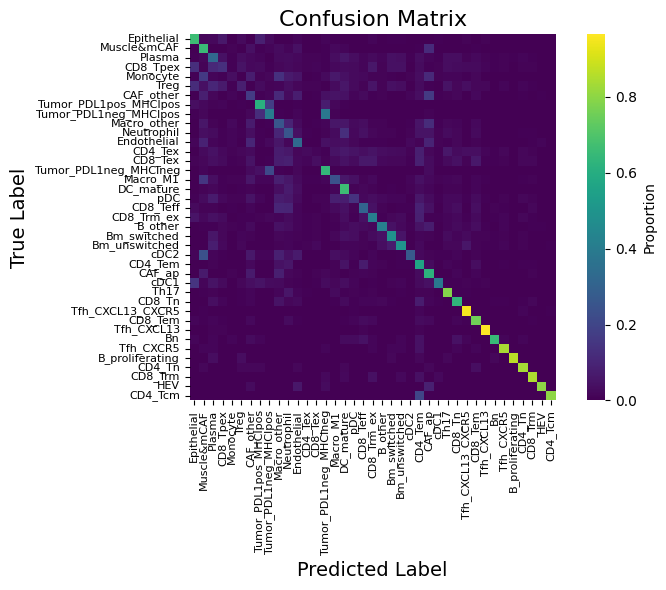

Computing confusion matrix...
Figure saved to NCRT/result/conf_matrix_tumor1_level1_hce.pdf


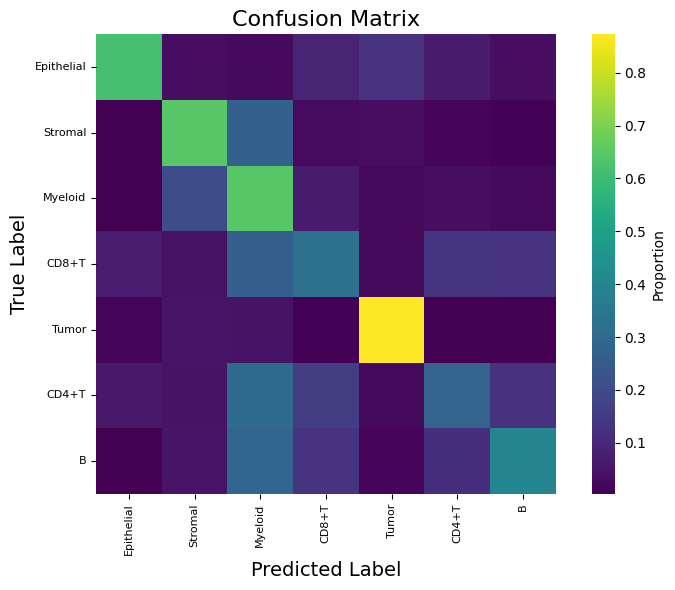

In [8]:
# Level2 confusion matrix
plot_confusion_matrix(
    val_labels,
    val_preds,
    class_names,
    save_path=f'{therapy_data}/{save_result}/conf_matrix_tumor1_level2_hce.pdf',
    # save_path=None
)

# Level1 confusion matrix
plot_confusion_matrix(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    save_path=f'{therapy_data}/{save_result}/conf_matrix_tumor1_level1_hce.pdf',
    # save_path=None
)

In [9]:
## Save validation metrics (row = LOGO mean over folds; acc columns are NaN)
import numpy as np

metrics_csv_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/hce_validation_metrics.csv"

hce_w1_used = globals().get("hce_w1", 1.0)
hce_w2_used = globals().get("hce_w2", 1.0)
hce_w12_used = globals().get("hce_w12", 1.0)
mean_best_epoch = int(round(float(np.mean([f["best_epoch"] for f in logo_summary["folds"]]))))

metrics_df, combined_df = save_hce_validation_metrics(
    val_acc=float("nan"),
    val_macro_f1=logo_summary["l2_macro_f1_mean"],
    val_weighted_f1=logo_summary["l2_weighted_f1_mean"],
    val_level1_acc=float("nan"),
    val_level1_macro_f1=logo_summary["l1_macro_f1_mean"],
    val_level1_weighted_f1=logo_summary["l1_weighted_f1_mean"],
    class_names=class_names if "class_names" in globals() else None,
    class_names_level1=class_names_level1 if "class_names_level1" in globals() else None,
    best_epoch=mean_best_epoch,
    hce_lambda=None,
    hce_w1=hce_w1_used,
    hce_w2=hce_w2_used,
    hce_w12=hce_w12_used,
    therapy_data=f"{therapy_data}_tumor1_LOGO",
    metrics_csv_path=metrics_csv_path,
)



Current run metrics:
             timestamp      therapy_data  best_epoch hce_lambda  hce_w1  \
0  2026-04-06 21:50:29  NCRT_tumor1_LOGO          31       None     1.0   

   hce_w2  hce_w12  val_l2_accuracy  val_l2_macro_f1  val_l2_weighted_f1  \
0     1.0      1.0              NaN         0.080241            0.321968   

   val_l1_accuracy  val_l1_macro_f1  val_l1_weighted_f1  num_l2_classes  \
0              NaN         0.316779            0.481981              39   

   num_l1_classes  
0               7  

Saved comparison table to: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/result/hce_validation_metrics.csv
Total rows: 3


Visualizing per-class performance...
  ✓ Computed metrics for 39 classes
Figure saved to NCRT/result/f1_per_class_tumor1_level2_hce.pdf


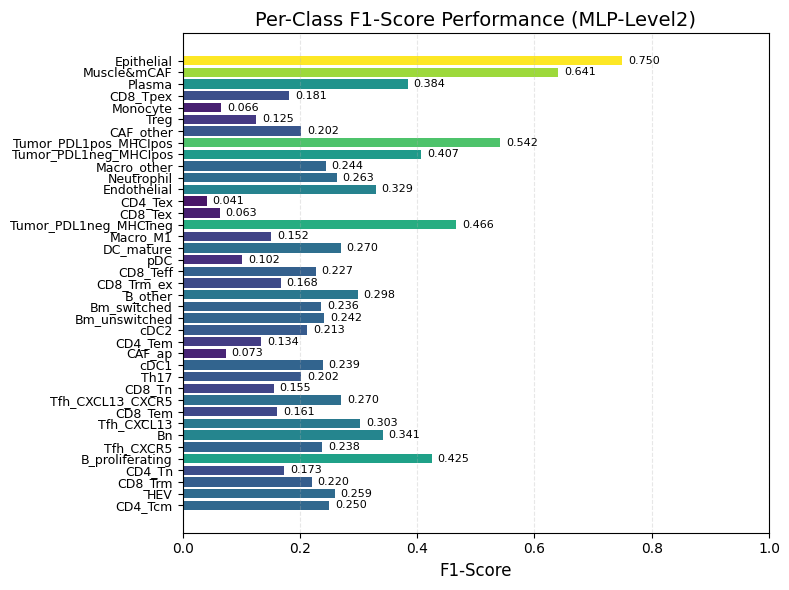


Model Summary:
  Device: cuda:1
  Total classes (before filtering): 39
  Actual classes in test set: 39
  Feature dimension: 384
  Model parameters: 676,462
  Best epoch: 33
  Test Accuracy: 0.3843
  Test Macro F1: 0.2579
  Test Weighted F1: 0.3874
Visualizing per-class performance...
  ✓ Computed metrics for 7 classes
Figure saved to NCRT/result/f1_per_class_tumor1_level1_hce.pdf


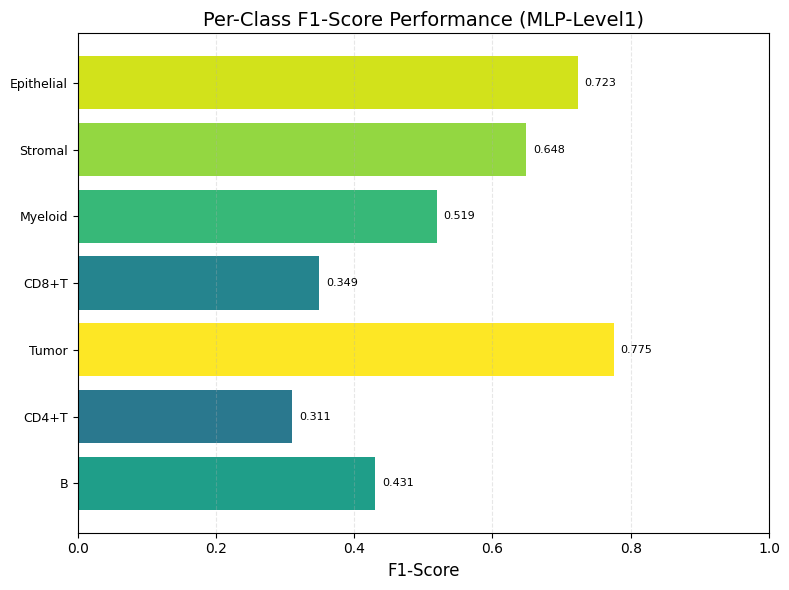


Model Summary:
  Device: cuda:1
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Feature dimension: 384
  Model parameters: 676,462
  Best epoch: 33
  Test Accuracy: 0.5675
  Test Macro F1: 0.5367
  Test Weighted F1: 0.5658


In [10]:
# Per-class F1 for level2
metrics_df_level2 = plot_per_class_f1(
    val_labels,
    val_preds,
    class_names,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_acc,
    test_macro_f1=val_macro_f1,
    test_weighted_f1=val_weighted_f1,
    model_name="MLP-Level2",
    # y_sort_by="f1_asc",
    save_path=f'{therapy_data}/{save_result}/f1_per_class_tumor1_level2_hce.pdf',
    # save_path=None
)

# Per-class F1 for level1
metrics_df_level1 = plot_per_class_f1(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_level1_acc,
    test_macro_f1=val_level1_macro_f1,
    test_weighted_f1=val_level1_weighted_f1,
    model_name="MLP-Level1",
    # y_sort_by="f1_asc",
    save_path=f'{therapy_data}/{save_result}/f1_per_class_tumor1_level1_hce.pdf',
    # save_path=None
)

  Using provided X and y...
  X_all_scaled shape: (80302, 384)
  y_all_encoded shape: (80302,)
  ✓ Final y_all_encoded dtype: int64
X_all_scaled:  (80302, 384)
y_all_encoded:  (80302,)
  ⚠ Large dataset detected (80302 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 80302
  DataLoader batch_size: 1024, num_workers: 0

Final Performance on All Data:
  Accuracy: 0.3842
  Macro F1-score: 0.2578
  Weighted F1-score: 0.3872
all_preds:  (80302,)
unique_labels:  (39,)

Detailed Classification Report:
  Number of classes: 39
                       precision    recall  f1-score   support

              B_other       0.23      0.42      0.30       426
      B_proliferating       0.28      0.86      0.42        59
          Bm_switched       0.16      0.49      0.24       376
        Bm_unswitched       0.16      0.49      0.24       354
                   Bn       0.23      0.65      0.34        69
               CAF_ap       0.04      0.62      0.07       223
        

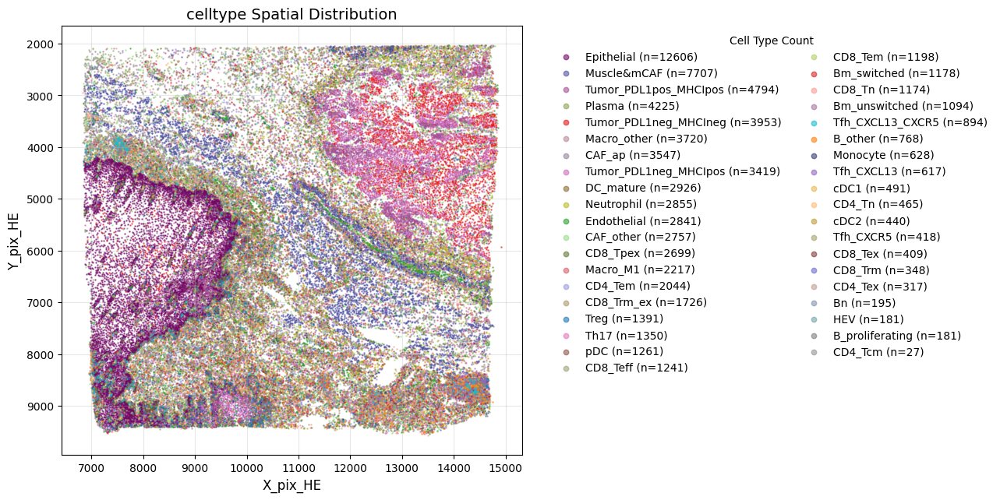


Plotting spatial distribution of TRUE cell types (for comparison)...
Number of valid data points: 80302
Number of cell types: 39


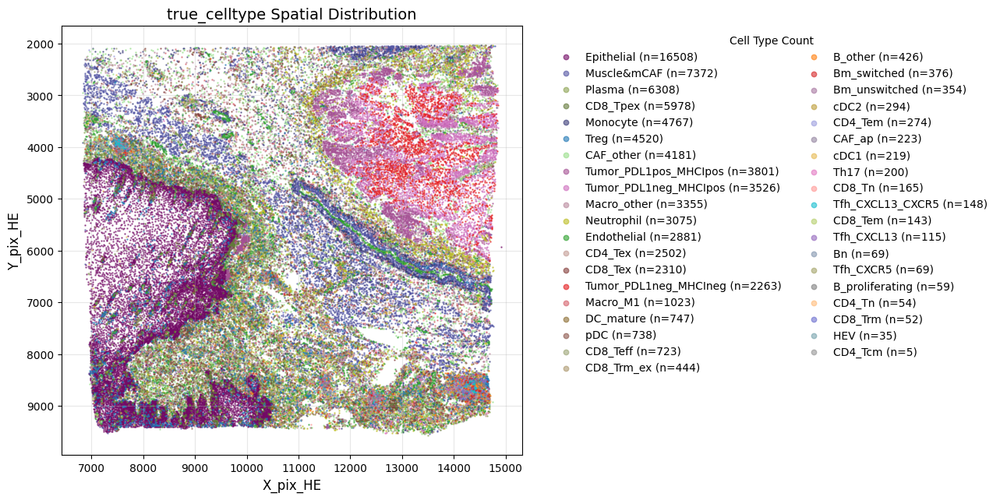

In [11]:
## Evaluate on all data and plot spatial distribution
# Skip loading npz here: rows must match ``cv_data`` filter and ``scaler`` fit on ``X_f``.
all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model,
    matched_features_path="",
    class_names=class_names,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=val_loader if "val_loader" in globals() else None,
    X=cv_data["X_f"],
    y=None,
    y_encoded=cv_data["y_encoded_f"],
    X_train=None,
    X_train_scaled=X_train_scaled if "X_train_scaled" in globals() else None,
    X_test_scaled=X_test_scaled if "X_test_scaled" in globals() else None,
    y_train_encoded=y_train_encoded if "y_train_encoded" in globals() else None,
    y_test_encoded=y_test_encoded if "y_test_encoded" in globals() else None,
    min_samples_per_class=min_samples_per_class if "min_samples_per_class" in globals() else 29,
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    # celltype_pred_dir = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_valid_tumor1_level2_hce.jpg',
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if "celltype_pixel_NCRT_tumor1" in globals() else None,
)

  Level1 spatial plot: using distinct palette for 7 class name(s).
Number of valid data points: 80302
Number of cell types: 7
Number of valid data points: 80302
Number of cell types: 7


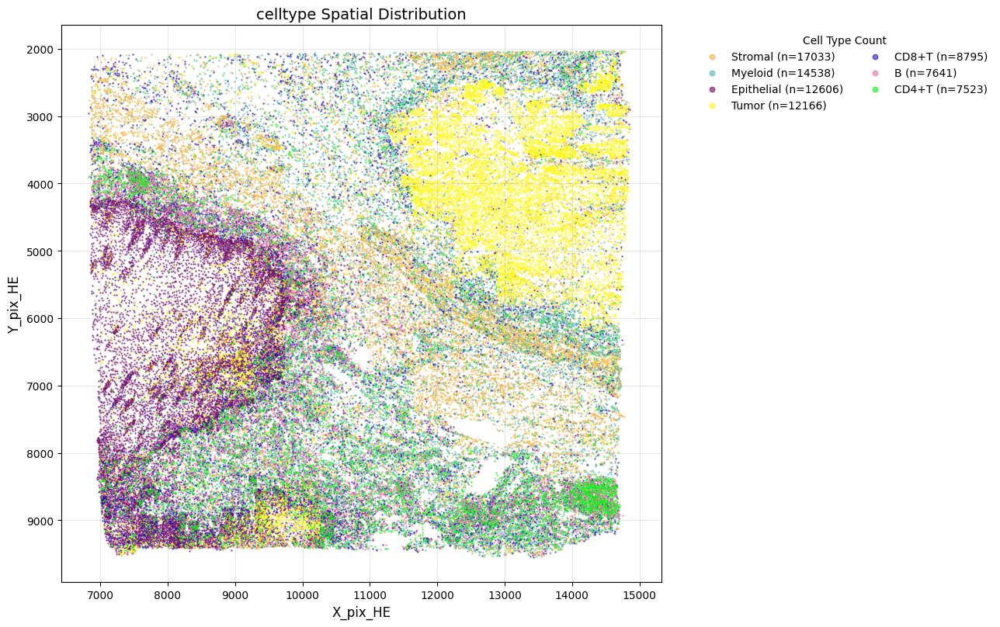

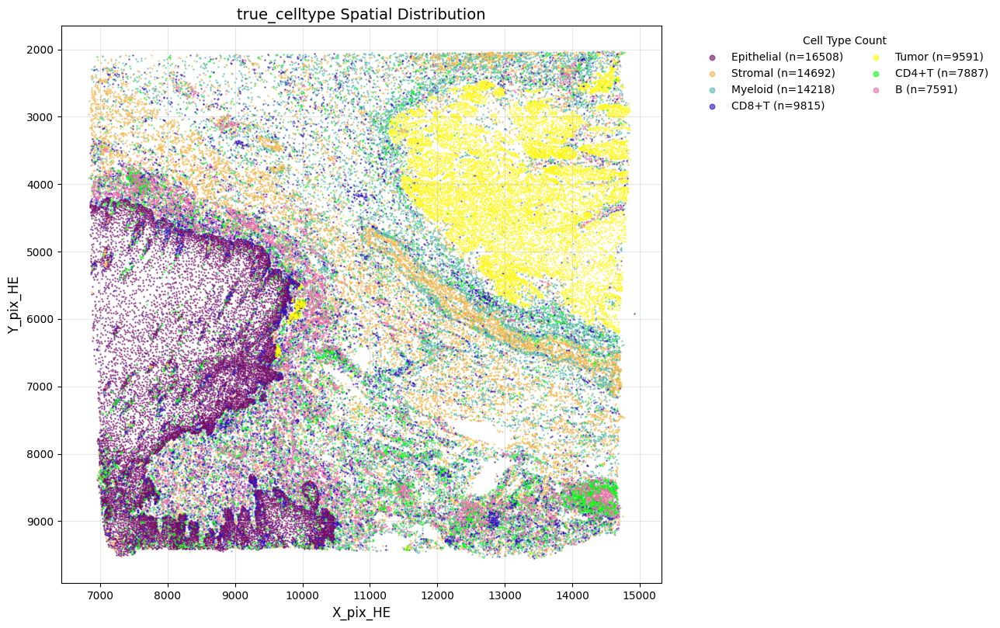

In [12]:
save_path_pred = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_valid_tumor1_level1_hce.jpg'
save_path_true = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_true_tumor1_level1_hce.jpg'
plot_level1_spatial_distribution(
    matched_features_path=matched_features_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=save_path_pred,
    save_path_true=save_path_true
)

## Predict StarDist

In [13]:
## Load best model for StarDist prediction.
model_star = load_model_for_predict(path, therapy_data, therapy_model)

Loading best model for StarDist prediction...
  Inferred hidden_dims from checkpoint: [1024, 512, 256]
✓ StarDist model loaded


In [14]:
## Tumor1
therapy_model = f'{therapy_data}_project_tumor1'
celltype_pixel_NCRT_stardist_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{transfer_data}/{therapy_data}_CellPixCoords_tumor1_StarDist.csv'
embedding_star_dir = Path(f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1_stardist/sc_pth_16_16")
matched_features_star_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1_stardist.npz"

match_tolerance = 1.0
X_star, y_star, y_star_level1, X_coords_star = match_hist2cell_matrix(
    cell_coords_path=celltype_pixel_NCRT_stardist_path,
    hist_embedding_dir=embedding_star_dir,
    matched_features_path=matched_features_star_path,
    coord_cols=("centroid_x", "centroid_y"),   # StarDist coordinates
    tolerance=match_tolerance,
    pth_prefix=f"sc_{therapy_data}",
)

Loading celltype Ground Truth ...
  Loaded 77996 cells
  Cell types: 40 unique types

  ✓ matched_features cache found; skipping .pth directory load.
Loading pre-saved matched data...
  ✓ Loaded from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz
  X shape: (77996, 384)
  y shape: (77996,)
  Number of classes: 40
  ✓ Coordinates found in saved data
  ✓ Coordinates loaded: (77996, 2)


  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz: (77996, 384)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz: (77996,), dtype: <U21
  ⚠ prediction_only=True: Labels will be used for visualization only, not for evaluation.
  ✓ Keeping labels as strings for visualization (no encoding needed)
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (77996, 384)
  No labels available - prediction mode only
X_all_scaled:  (77996, 384)
dummy_labels:  (77996,)
  ⚠ Large dataset detected (77996 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 77996
  DataLoader batch_size: 1024, num_workers: 0
  Predicting on new data (no labels for evaluation)...


Predicting: 100%|██████████| 77/77 [00:00<00:00, 128.56it/s]



Prediction completed:
  Total predictions: 77996
  Predicted classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
  ✓ Using original labels for visualization: 77996 labels
  ⚠ 1 true labels are not in class_names; excluding them from metric computation.
  ✓ Computed metrics in prediction_only mode from aligned true labels: acc=0.2181, macro_f1=0.0883, weighted_f1=0.2347

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1/matched_features_tumor1_stardist.npz: (77996, 2)
  Coordinates shape: (77996, 2)
  Predictions shape: (77996,)
  ✓ Created prediction DataFrame with 77996 cells

Plotting spatial distribution of PREDICTED cell types...
Number of valid data points: 77996
Number of cell types: 39

Plotting spatial distribution of TRUE cell types (for comparison)...
Number of valid 

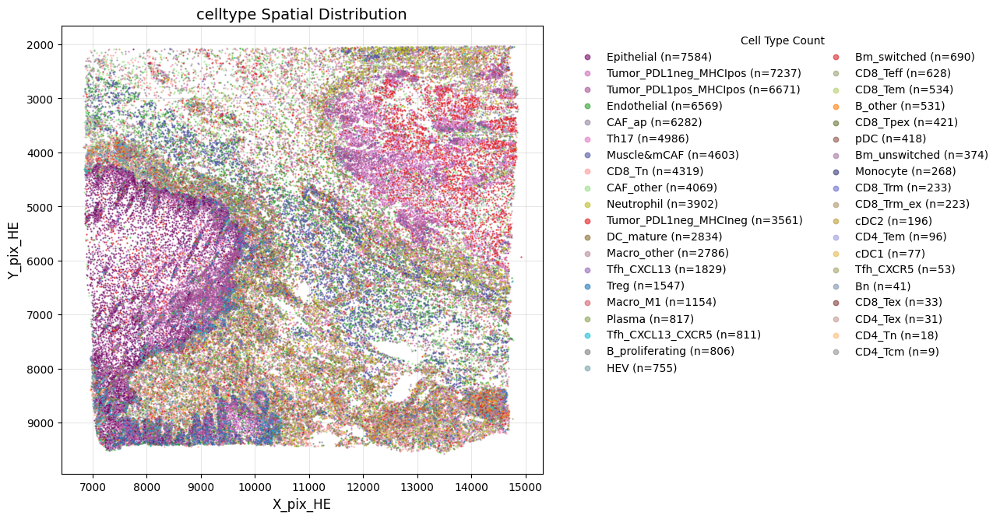

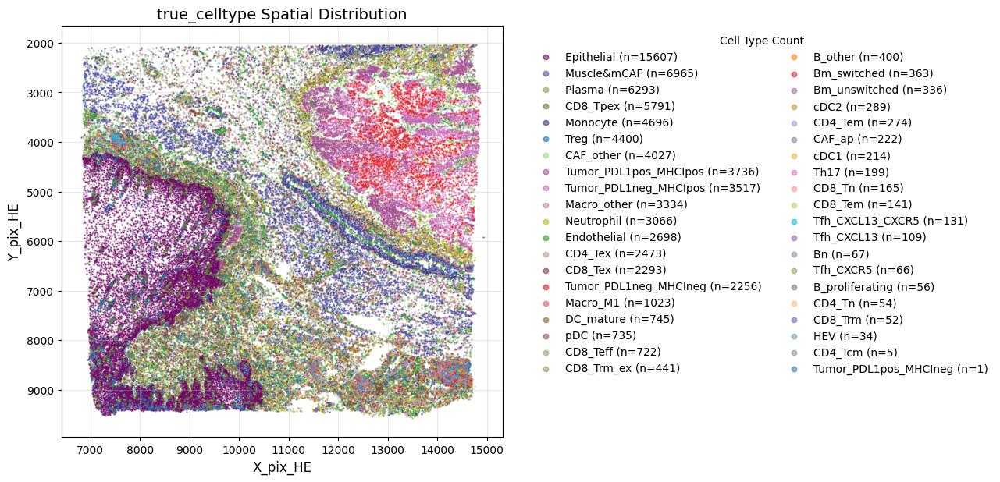

In [15]:
# Predict on StarDist-matched data and plot spatial distribution (level2 + level1).
class_names_star = class_names if "class_names" in globals() and class_names is not None else [
    str(i) for i in range(num_classes_star)
]

all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model_star,
    matched_features_path=matched_features_star_path,
    class_names=class_names_star,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=None,
    prediction_only=True,
    # Optional coordinate fallback when X_coords are missing in npz.
    X_coords_matched=X_coords_star if "X_coords_star" in globals() else None,
    celltype_pred_dir=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_pred_tumor1_level2_hce.jpg',
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_stardist if "celltype_pixel_NCRT_stardist" in globals() else None,
)

  Level1 spatial plot: using distinct palette for 7 class name(s).
Number of valid data points: 77996
Number of cell types: 7
Number of valid data points: 77996
Number of cell types: 7
Saved StarDist level1 predicted/true spatial plots.


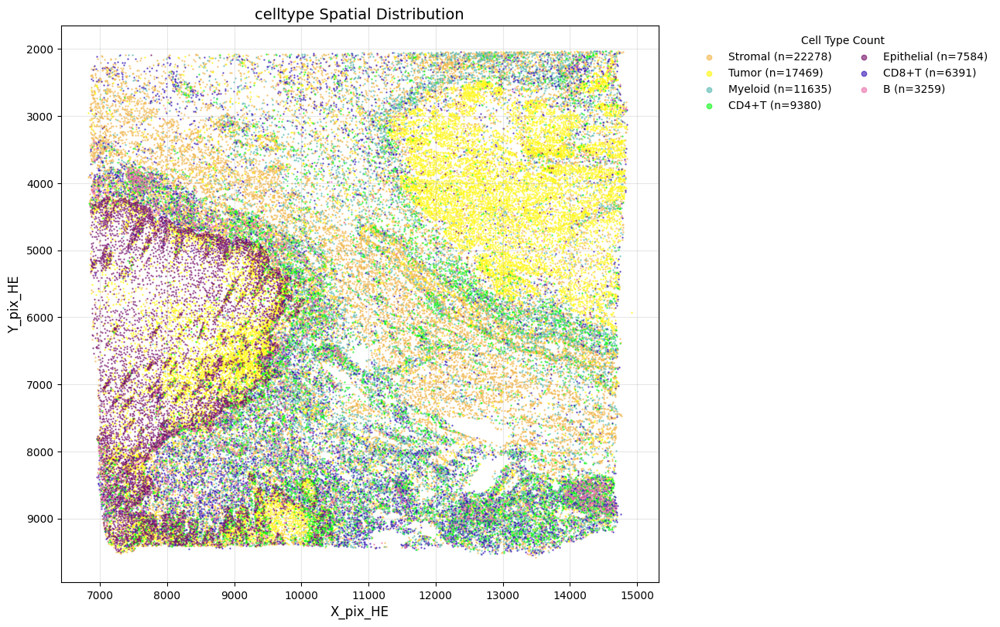

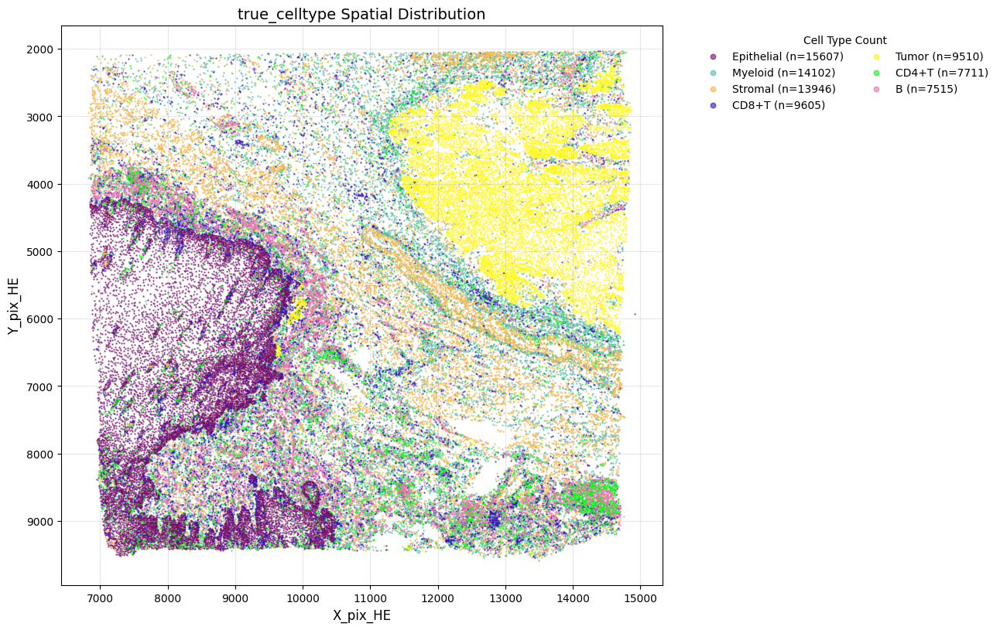

In [16]:
save_path_pred = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_pred_tumor1_level1_hce.jpg'
save_path_true = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/celltype_true_tumor1_level1_hce.jpg'

plot_level1_spatial_distribution(
    matched_features_path=matched_features_star_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=save_path_pred,
    save_path_true=save_path_true
)
print("Saved StarDist level1 predicted/true spatial plots.")

Visualizing per-class accuracy...
  ✓ Computed metrics for 40 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/result/acc_tumor1_level2_stardist_hce.pdf


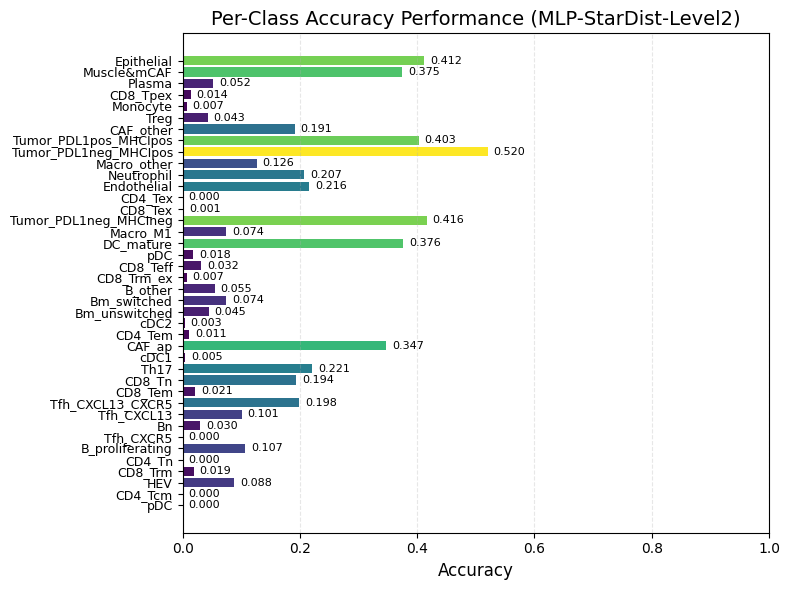


Model Summary:
  Device: cuda:1
  Total classes (before filtering): 39
  Actual classes in test set: 40
  Model parameters: 1,065,774
  Test Accuracy: 0.2181
  Test Macro F1: 0.0883
  Test Weighted F1: 0.2347
  Level1 metrics from level2 preds: acc=0.4077, macro_f1=0.3613, weighted_f1=0.3912
Visualizing per-class accuracy...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/result/acc_tumor1_level1_stardist_hce.pdf


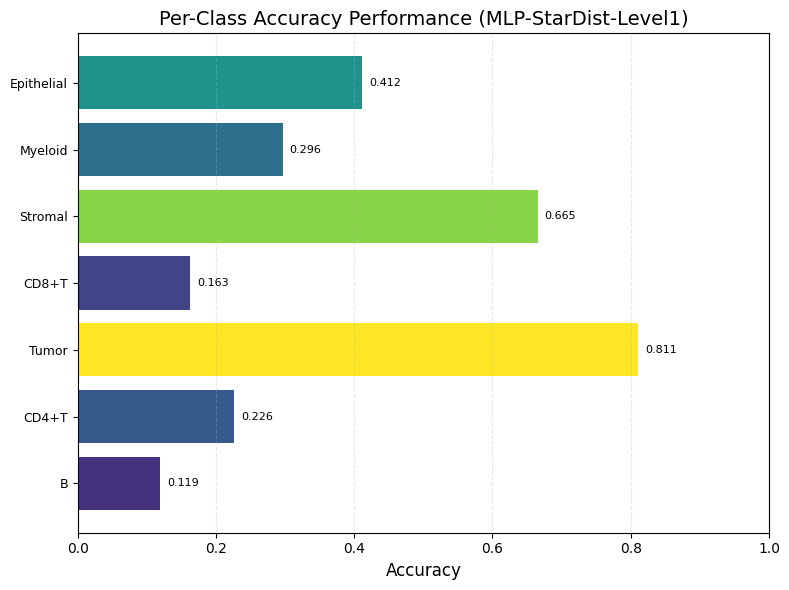


Model Summary:
  Device: cuda:1
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Model parameters: 1,065,774
  Test Accuracy: 0.4077
  Test Macro F1: 0.3613
  Test Weighted F1: 0.3912


In [17]:
metrics_acc_star = plot_per_class_accuracy(
    all_labels,
    all_preds,
    class_names_star,
    model=model_star,
    device=device,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    test_acc=all_acc,
    test_macro_f1=all_macro_f1,
    test_weighted_f1=all_weighted_f1,
    model_name="MLP-StarDist-Level2",
    save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/acc_tumor1_level2_stardist_hce.pdf',
)

metrics_acc_star_l1 = plot_level1_accuracy_from_level2_predictions(
    matched_features_path=matched_features_star_path,
    all_preds=all_preds,
    class_names=class_names,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_accuracy=plot_per_class_accuracy,
    model=model_star,
    device=device,
    model_name="MLP-StarDist-Level1",
    save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{save_result}/acc_tumor1_level1_stardist_hce.pdf',
)